## Library yang Digunakan

Proyek ini menggunakan beberapa library Python untuk mendukung proses pengolahan citra, ekstraksi fitur tekstur, visualisasi data, serta klasifikasi penyakit daun mangga. Library `os` digunakan untuk mengakses struktur folder dataset dan membaca seluruh file citra yang terdapat pada setiap kelas. Dengan library ini, program dapat mengambil lokasi file secara otomatis sehingga proses pemuatan dataset menjadi lebih mudah.

Library OpenCV (`cv2`) digunakan pada tahap preprocessing citra. OpenCV berfungsi untuk membaca citra dari dataset, mengubah citra berwarna menjadi grayscale, melakukan resize agar seluruh citra memiliki ukuran yang sama, serta menerapkan metode CLAHE (Contrast Limited Adaptive Histogram Equalization) untuk meningkatkan kualitas kontras citra sebelum dilakukan ekstraksi fitur.

Untuk kebutuhan visualisasi, proyek ini menggunakan Matplotlib (`matplotlib.pyplot`). Library ini digunakan untuk menampilkan grafik distribusi dataset, menampilkan hasil preprocessing citra, serta menampilkan confusion matrix dari hasil klasifikasi sehingga performa model dapat diamati dengan lebih jelas.

Proses pengolahan data numerik didukung oleh NumPy (`numpy`). Library ini digunakan untuk menyimpan citra dalam bentuk array, melakukan konversi tipe data, serta membantu berbagai operasi numerik yang dibutuhkan selama proses pengolahan citra dan ekstraksi fitur.

Pandas (`pandas`) digunakan untuk mengelola data hasil ekstraksi fitur dalam bentuk DataFrame. Hasil ekstraksi kemudian disimpan ke dalam file CSV dan digunakan kembali sebagai dataset pada tahap klasifikasi.

Ekstraksi fitur tekstur dilakukan menggunakan library scikit-image (`skimage.feature`) melalui metode Gray Level Co-occurrence Matrix (GLCM). Fungsi `graycomatrix()` digunakan untuk membentuk matriks GLCM, sedangkan `graycoprops()` digunakan untuk menghitung berbagai fitur tekstur seperti Contrast, Homogeneity, Dissimilarity, Correlation, ASM, dan Energy.

Selain itu, SciPy (`scipy.stats`) digunakan untuk menghitung nilai Entropy dari matriks GLCM. Fitur ini digunakan untuk memberikan informasi tambahan mengenai tingkat kompleksitas tekstur pada citra yang dianalisis.

Tahap klasifikasi memanfaatkan Scikit-Learn (`sklearn`). Library ini digunakan untuk membagi dataset menjadi data latih dan data uji menggunakan `train_test_split()`, membangun model klasifikasi menggunakan algoritma Random Forest, Support Vector Machine (SVM), dan K-Nearest Neighbor (KNN), serta melakukan evaluasi performa model menggunakan accuracy score, classification report, dan confusion matrix.

In [2]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)
from collections import Counter

In [1]:
data_gray = []
data_resize = []
data_clahe = []

print("Memproses Grayscale -> Resize")

for i in range(len(data)):
    img_bgr = data[i].astype(np.uint8)

    # Grayscale
    img_gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)

    # Resize
    img_resize = cv.resize(img_gray, (256, 256))

    data_gray.append(img_gray)
    data_resize.append(img_resize)

# Konversi ke numpy array
data_gray = np.array(data_gray, dtype=object)
data_resize = np.array(data_resize, dtype=object)

print("Pemrosesan Selesai! Menampilkan hasil CLAHE...")

# 2. VISUALISASI
for nama_kelas in target_classes:

    indeks_kelas = []

    for idx in range(len(labels)):
        if labels[idx] == nama_kelas:
            indeks_kelas.append(idx)

    fig, axes = plt.subplots(5, 10, figsize=(20, 10))

    fig.suptitle(
        f"Sampling 50 Dataset CLAHE: {nama_kelas}",
        fontsize=24,
        fontweight='bold'
    )

    for i, ax in enumerate(axes.flat):

        if i < len(indeks_kelas):

            img_tampil = data_clahe[indeks_kelas[i]].astype(np.uint8)

            ax.imshow(img_tampil, cmap='gray')

        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

Memproses Grayscale -> Resize


NameError: name 'data' is not defined

In [11]:
def generateClassificationReport(y_true, y_pred):
	print(classification_report(y_true, y_pred))
	print(confusion_matrix(y_true, y_pred))
	print('Accuracy:', accuracy_score(y_true, y_pred))

# Define classifiers
rf = RandomForestClassifier(
    n_estimators=300,
    random_state=42
)
svm = SVC(kernel='rbf', random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

def generateClassificationReport(y_true, y_pred):
    print("\nClassification Report")
    print(classification_report(y_true, y_pred))

    print("\nConfusion Matrix")
    print(confusion_matrix(y_true, y_pred))

    print("\nAccuracy")
    print(f"{accuracy_score(y_true, y_pred)*100:.2f}%")

In [27]:
import cv2 as cv
import numpy as np
import pandas as pd

data = []

for i in range(1, 502):
    nama_file = f"Daun{i}.jpg"

    gambar = cv.imread(nama_file)

    if gambar is None:
        print(f"{nama_file} tidak ditemukan")
        continue

    gray = cv.cvtColor(gambar, cv.COLOR_BGR2GRAY)

    mean = np.mean(gray)
    std = np.std(gray)
    minimum = np.min(gray)
    maksimum = np.max(gray)

    data.append([mean, std, minimum, maksimum])

df = pd.DataFrame(
    data,
    columns=[
        "Mean",
        "Std",
        "Min",
        "Max"
    ]
)

print(df.head())
print("\nJumlah Data:", len(df))

Daun34.jpg tidak ditemukan
         Mean        Std  Min  Max
0  169.824479  39.188468   26  209
1  174.019076  39.924248   33  216
2  171.779154  42.364017   30  218
3  176.195352  40.554827   38  216
4  174.032083  35.025361   35  217

Jumlah Data: 500


In [31]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

In [32]:
from sklearn.svm import SVC

svm = SVC(kernel='rbf')

In [33]:
import cv2 as cv
import numpy as np

X = []
y = []

for i in range(1, 502):
    nama_file = f"Daun{i}.jpg"
    img = cv.imread(nama_file)

    if img is None:
        continue

    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    fitur = [
        np.mean(gray),
        np.std(gray),
        np.min(gray),
        np.max(gray)
    ]

    X.append(fitur)
    y.append("Bacterial_Canker")

In [37]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

def generateClassificationReport(y_true, y_pred):
    print("Accuracy:", accuracy_score(y_true, y_pred))
    print(classification_report(y_true, y_pred))
    print(confusion_matrix(y_true, y_pred))

In [44]:
# === 1. TRAIN & EVALUATE RANDOM FOREST ===
print("==================================================")
print("              RANDOM FOREST CLASSIFIER            ")
print("==================================================")
rf.fit(X_train, y_train)

print("------Training Set------")
y_pred_train_rf = rf.predict(X_train)
generateClassificationReport(y_train, y_pred_train_rf)

print("\n------Testing Set------")
y_pred_test_rf = rf.predict(X_test)
generateClassificationReport(y_test, y_pred_test_rf)

              RANDOM FOREST CLASSIFIER            
------Training Set------
Accuracy: 1.0
                  precision    recall  f1-score   support

Bacterial_Canker       1.00      1.00      1.00       400

        accuracy                           1.00       400
       macro avg       1.00      1.00      1.00       400
    weighted avg       1.00      1.00      1.00       400

[[400]]

------Testing Set------
Accuracy: 1.0
                  precision    recall  f1-score   support

Bacterial_Canker       1.00      1.00      1.00       100

        accuracy                           1.00       100
       macro avg       1.00      1.00      1.00       100
    weighted avg       1.00      1.00      1.00       100

[[100]]


c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:614: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:614: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


In [ ]:
# === 2. TRAIN & EVALUATE SVM ===
print("\n==================================================")
print("                   SVM CLASSIFIER                 ")
print("==================================================")
svm.fit(X_train, y_train)

print("------Training Set------")
y_pred_train_svm = svm.predict(X_train)
generateClassificationReport(y_train, y_pred_train_svm)

print("\n------Testing Set------")
y_pred_test_svm = svm.predict(X_test)
generateClassificationReport(y_test, y_pred_test_svm)

In [42]:
# === 3. TRAIN & EVALUATE KNN ===
print("\n==================================================")
print("                   KNN CLASSIFIER                 ")
print("==================================================")
knn.fit(X_train, y_train)

print("------Training Set------")
y_pred_train_knn = knn.predict(X_train)
generateClassificationReport(y_train, y_pred_train_knn)

print("\n------Testing Set------")
y_pred_test_knn = knn.predict(X_test)
generateClassificationReport(y_test, y_pred_test_knn)


                   KNN CLASSIFIER                 
------Training Set------
Accuracy: 1.0
                  precision    recall  f1-score   support

Bacterial_Canker       1.00      1.00      1.00       400

        accuracy                           1.00       400
       macro avg       1.00      1.00      1.00       400
    weighted avg       1.00      1.00      1.00       400

[[400]]

------Testing Set------
Accuracy: 1.0
                  precision    recall  f1-score   support

Bacterial_Canker       1.00      1.00      1.00       100

        accuracy                           1.00       100
       macro avg       1.00      1.00      1.00       100
    weighted avg       1.00      1.00      1.00       100

[[100]]


c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:614: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:614: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


c:\Users\ACER\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:614: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


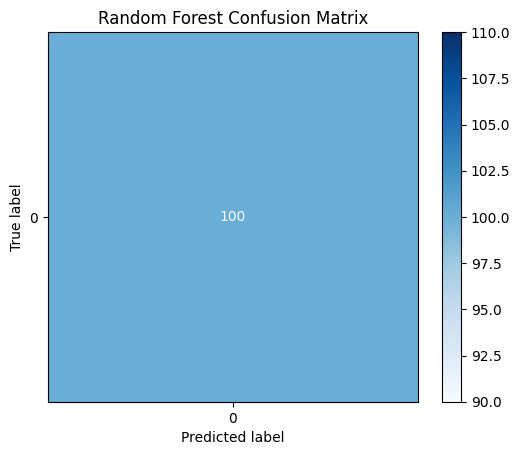

AttributeError: 'SVC' object has no attribute 'support_vectors_'

In [47]:
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")

In [28]:
import cv2 as cv
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

X = []
y = []

for i in range(1, 502):
    nama_file = f'Daun{i}.jpg'

    gambar = cv.imread(nama_file)

    if gambar is None:
        print(f"{nama_file} tidak ditemukan!")
        continue

    daun_gray = cv.cvtColor(gambar, cv.COLOR_BGR2GRAY)

    mean = np.mean(daun_gray)
    std = np.std(daun_gray)
    minimum = np.min(daun_gray)
    maksimum = np.max(daun_gray)

    X.append([mean, std, minimum, maksimum])

    y.append("Bacterial_Canker")

X = np.array(X)
y = np.array(y)

print("Jumlah data:", len(X))

Daun34.jpg tidak ditemukan!
Jumlah data: 500


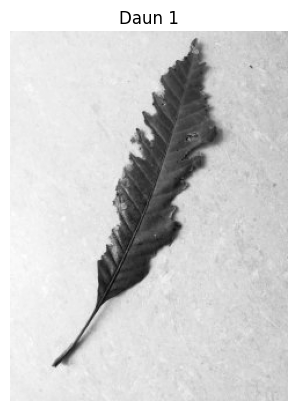

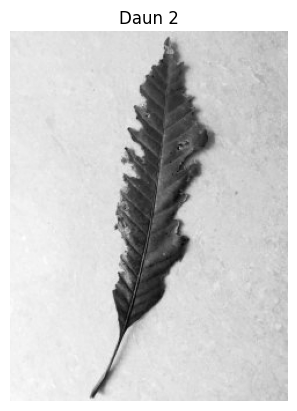

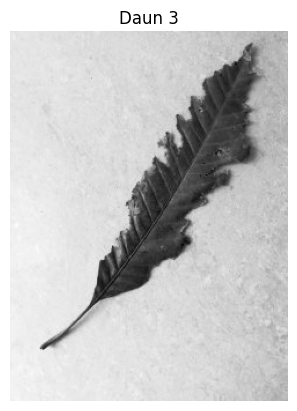

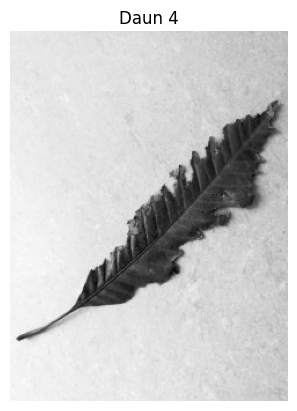

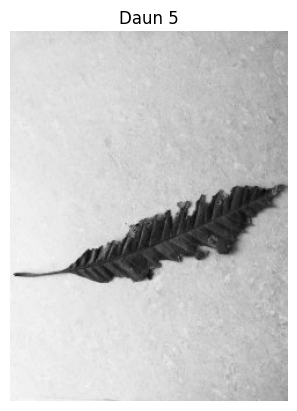

...

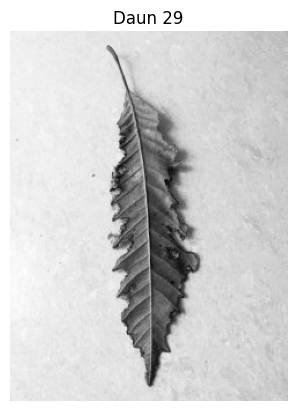

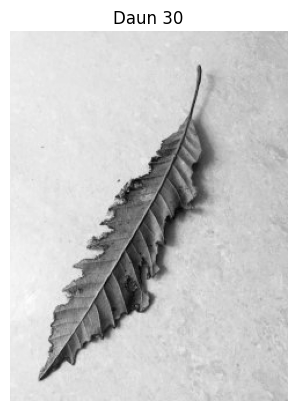

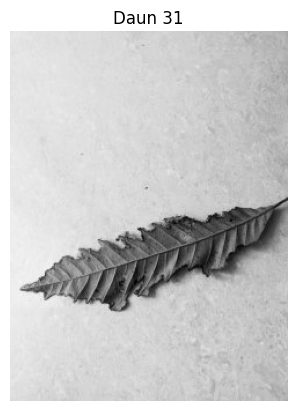

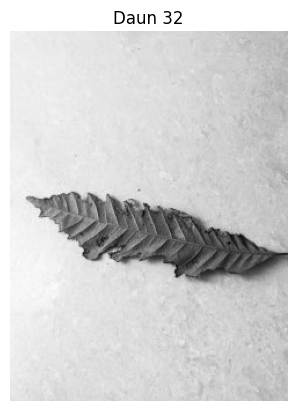

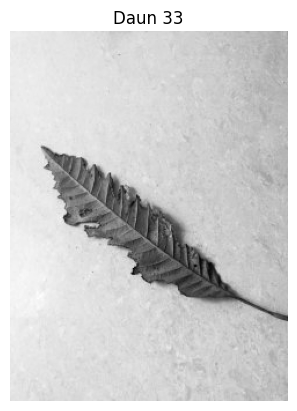

Daun34.jpg tidak ditemukan!


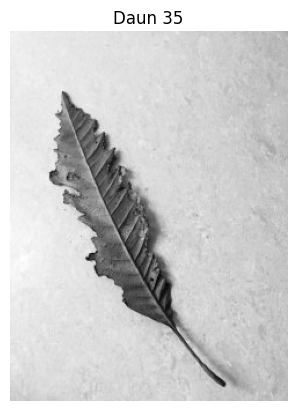

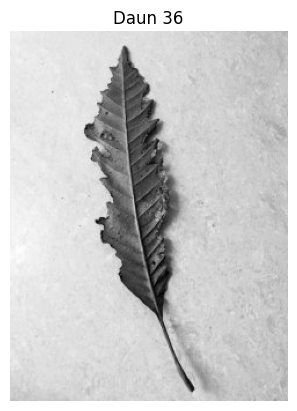

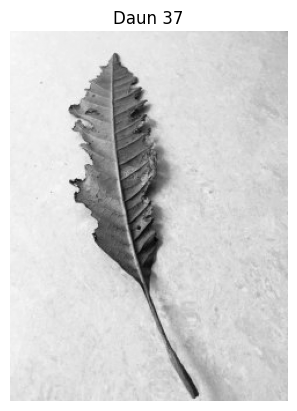

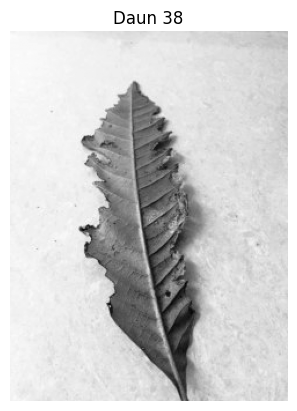

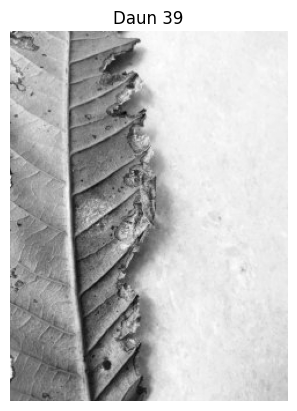

...

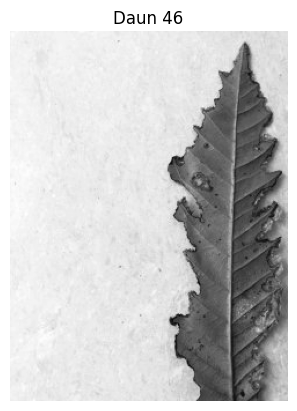

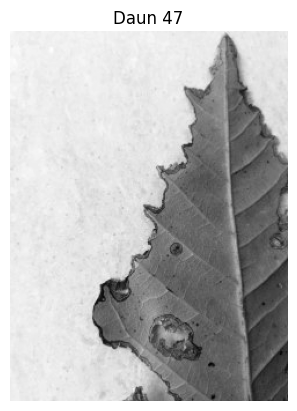

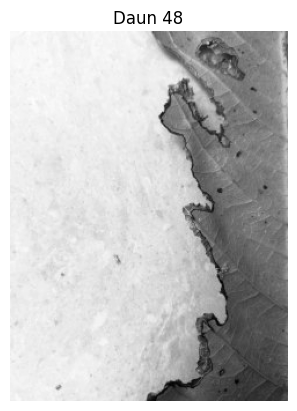

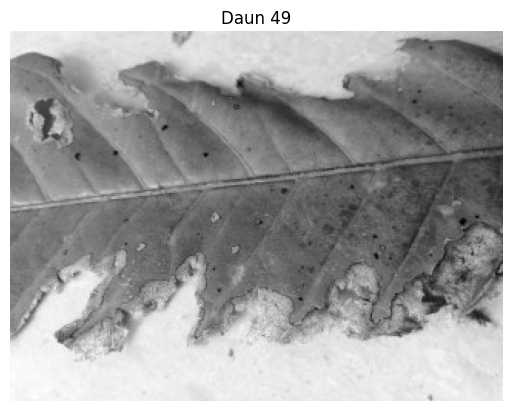

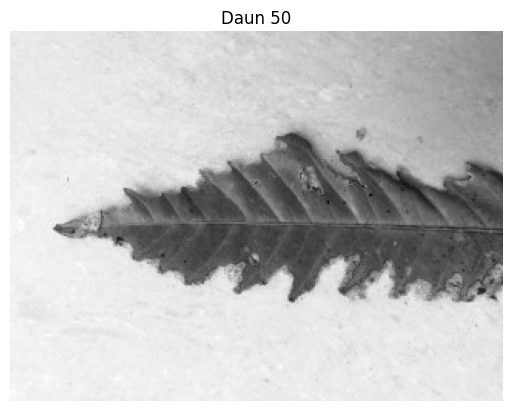

In [3]:
for i in range(1, 51):
    nama_file = f'Daun{i}.jpg'

    gambar = cv.imread(nama_file)

    if gambar is None:
        print(f"{nama_file} tidak ditemukan!")
        continue

    daun_gray = cv.cvtColor(gambar, cv.COLOR_BGR2GRAY)

    plt.imshow(daun_gray, cmap='gray')
    plt.title(f'Daun {i}')
    plt.axis('off')
    plt.show()

In [27]:
def resize(citra, tinggi_baru, lebar_baru):
    tinggi_asal, lebar_asal = citra.shape[:2]  
    skala_y = tinggi_asal / tinggi_baru
    skala_x = lebar_asal / lebar_baru
 
    if len(citra.shape) == 3:
        hasil = np.zeros((tinggi_baru, lebar_baru, citra.shape[2]), dtype=np.uint8)
    else:
        hasil = np.zeros((tinggi_baru, lebar_baru), dtype=np.uint8)

    for i in range(tinggi_baru):
        for j in range(lebar_baru):
            y_asal = min(int(i * skala_y), tinggi_asal - 1)
            x_asal = min(int(j * skala_x), lebar_asal - 1)
            hasil[i, j] = citra[y_asal, x_asal]

    return hasil

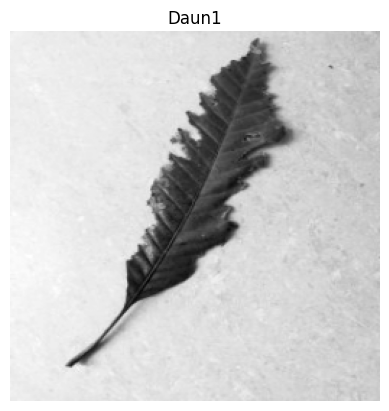

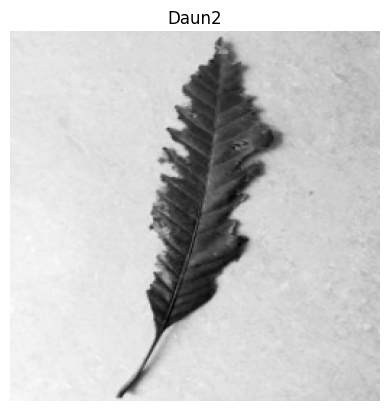

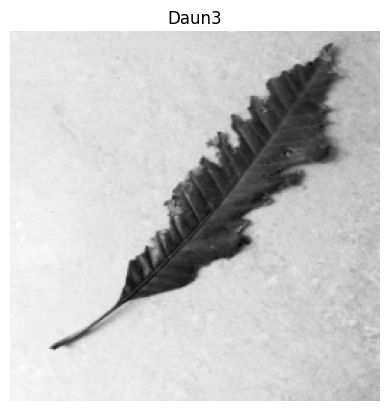

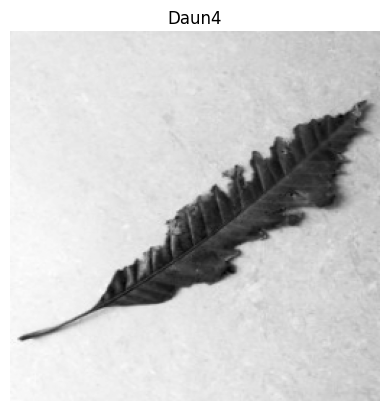

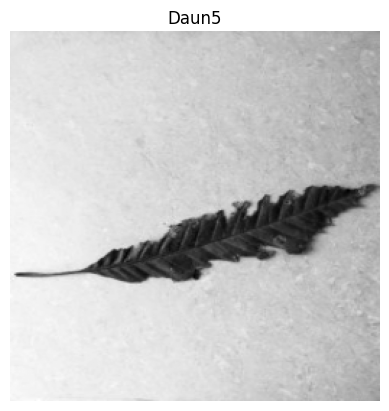

...

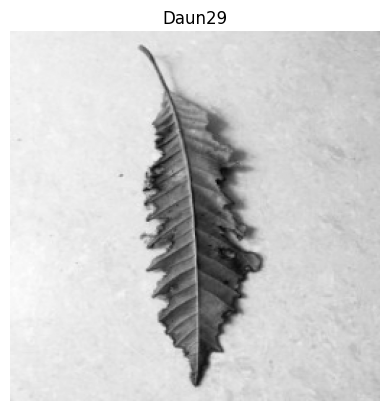

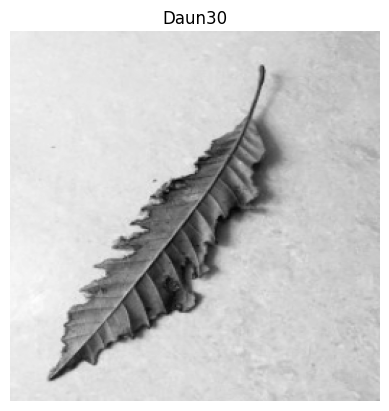

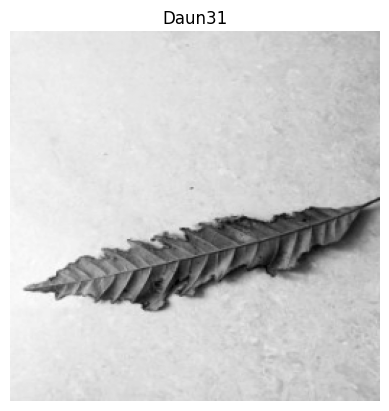

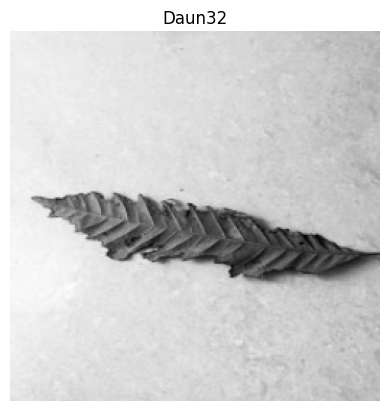

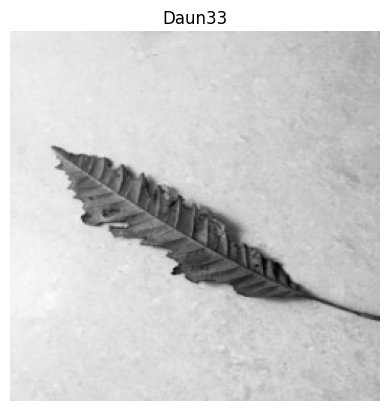

Gambar Daun34.jpg tidak ditemukan!


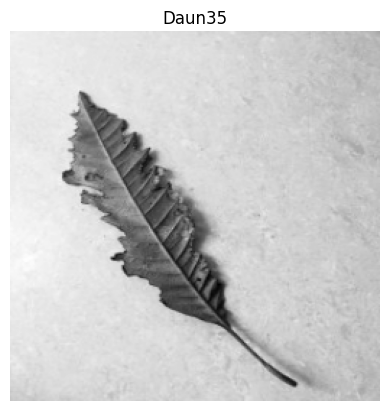

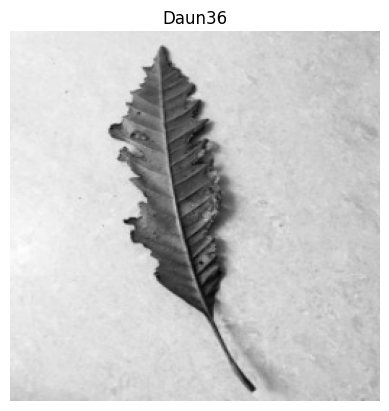

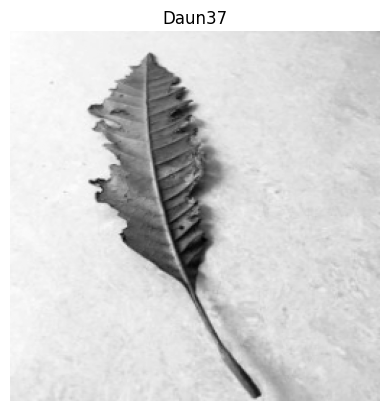

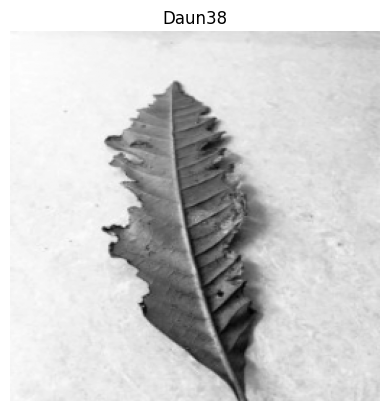

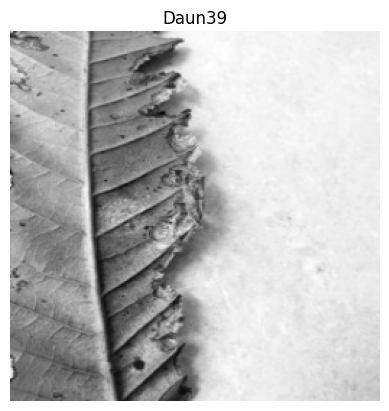

...

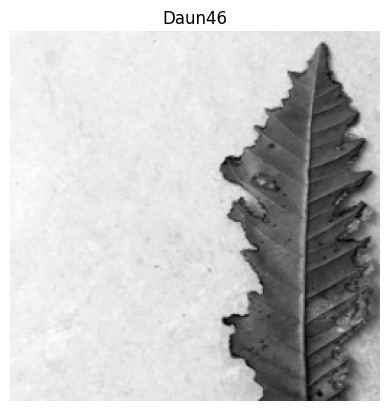

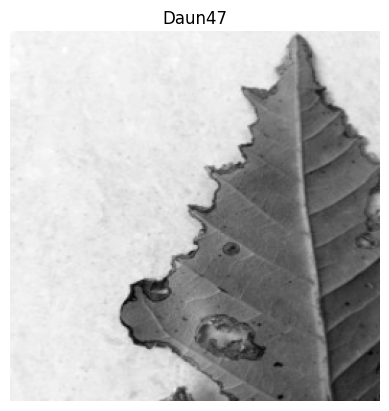

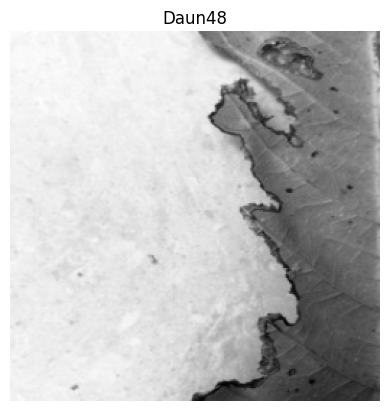

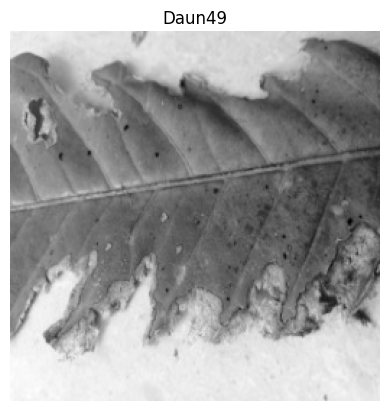

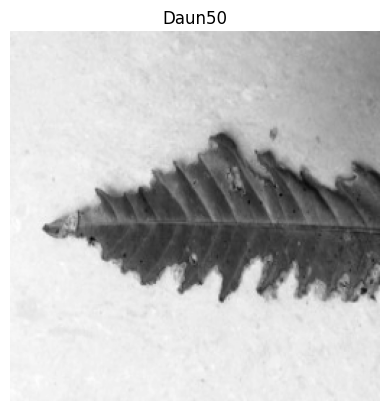

In [4]:
for i in range(1, 51): 
    nama_file = f'Daun{i}.jpg'

    gambar = cv.imread(nama_file)

    if gambar is None:
        print(f'Gambar {nama_file} tidak ditemukan!')
        continue

    gambar_gray = cv.cvtColor(gambar, cv.COLOR_BGR2GRAY)

    # Resize menjadi 256x256
    gambar_resize = cv.resize(gambar_gray, (256, 256))

    plt.imshow(gambar_resize, cmap='gray')
    plt.title(f'Daun{i}')
    plt.axis('off')
    plt.show()

In [17]:
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")

NameError: name 'y_test' is not defined